# Diabetic Retinopathy and Glaucoma Detection

The purpose of this notebook is to automate detection of the above eye disorders in using fundus images. The dataset for this study can be obtained [here](https://www.kaggle.com/c/vietai-advance-course-retinal-disease-detection/data).

In [1]:
COLAB = 'google.colab' in str(get_ipython())
import tensorflow as tf
import os
if COLAB:
  from google.colab import drive
  drive.mount('/content/drive')
  if not os.path.isdir('/content/Data'):
    os.chdir('/content/drive/MyDrive/FourthBrain/Midterm')
    !unzip -qq Midterm_Data.zip "Data/RGB/*" -d /content
    !unzip -qq Midterm_Data.zip "Data/*.csv" -d /content

  %config InlineBackend.figure_format='retina'
else:
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    os.environ["CUDA_VISIBLE_DEVICES"] = '1'
    tf.config.list_physical_devices('GPU')

In [2]:
from typing import List
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from importlib import reload
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from keras.losses import BinaryCrossentropy
from keras.regularizers import l2
from keras.metrics import Precision, Recall
from keras.models import Model
from tensorflow_addons.metrics import F1Score
import matplotlib.cm as cm
from PIL import Image

In [3]:
import helper as h
reload(h);

In [4]:
BASE_DIR = '/content/' if COLAB else './Data/'
DATA_DIR = BASE_DIR + 'RGB-CLAHE/'
RGB_DIR = BASE_DIR + 'RGB/'
TRAIN_DIR = 'train/'
TEST_DIR = 'test/'

RAND_SEED = 42
RAW_IMG_SIZE = (512, 512, 3)
IMG_SIZE = (256, 256, 3)
SIG_THRESH = 0.37

## 1. Expoloratory Data Analysis

In [5]:
df_csv = pd.read_csv(DATA_DIR + '../train.csv')
df_csv.head(4)

,filename,opacity,diabetic retinopathy,glaucoma,macular edema,macular degeneration,retinal vascular occlusion,normal
0,c24a1b14d253.jpg,0,0,0,0,0,1,0
1,9ee905a41651.jpg,0,0,0,0,0,1,0
2,3f58d128caf6.jpg,0,0,1,0,0,0,0
3,4ce6599e7b20.jpg,1,0,0,0,1,0,0


In [6]:
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3435 entries, 0 to 3434
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   filename                    3435 non-null   object
 1   opacity                     3435 non-null   int64 
 2   diabetic retinopathy        3435 non-null   int64 
 3   glaucoma                    3435 non-null   int64 
 4   macular edema               3435 non-null   int64 
 5   macular degeneration        3435 non-null   int64 
 6   retinal vascular occlusion  3435 non-null   int64 
 7   normal                      3435 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 214.8+ KB


All columns are of the correct type and there are no missing fields

In [7]:
df_csv.iloc[:, 1:].sum()

opacity                       1533
diabetic retinopathy           755
glaucoma                       597
macular edema                  516
macular degeneration           574
retinal vascular occlusion     440
normal                         525
dtype: int64

The largest class, by far is Opacity, with the remaining being more balanced

#### Client has asked us to consolidate all disorders _Other_ than i. Diabetic Retinopathy and ii. Glaucoma.

In [8]:
classes = ['DiabeRetino', 'Glaucoma', 'Other', 'Normal']
disorders = classes[:-1]

In [9]:
df = df_csv.copy()
consolidate_cols = [1, 4, 5, 6]
df['other'] = df.iloc[:, consolidate_cols].sum(axis=1)
df['other'] = df['other'].apply(lambda x: min(x, 1))
df.drop(columns=df.columns[consolidate_cols], inplace=True)
df = df[['filename', 'diabetic retinopathy', 'glaucoma', 'other', 'normal']]
df.columns = ['Filename'] + classes
df.head(4)

,Filename,DiabeRetino,Glaucoma,Other,Normal
0,c24a1b14d253.jpg,0,0,1,0
1,9ee905a41651.jpg,0,0,1,0
2,3f58d128caf6.jpg,0,1,0,0
3,4ce6599e7b20.jpg,0,0,1,0


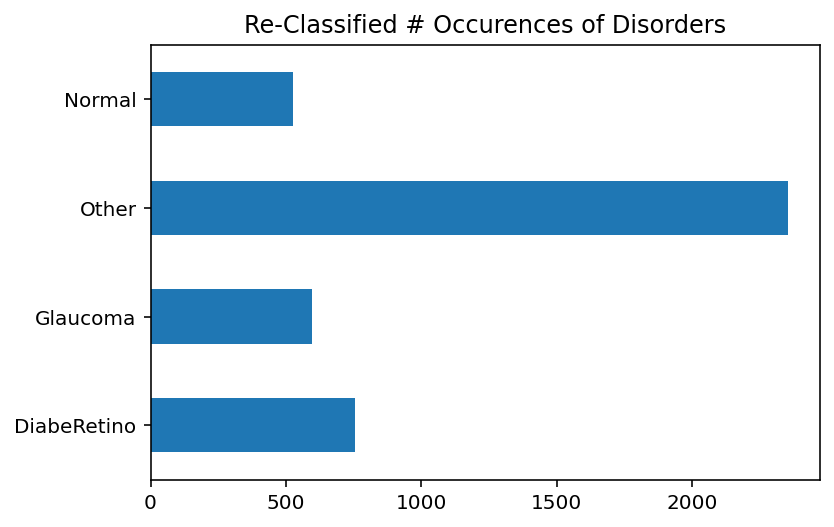

In [10]:
occurences = df.iloc[:, 1:].sum()
occurences.plot(kind='barh', title='Re-Classified # Occurences of Disorders');

There is severe class imbalance between the three disorders

### 1.1 Examine some samples from each class

In [11]:
train_files = {}
for klass in classes:
    train_files[klass] = list(df[df[klass] == 1]['Filename'])
    print(f'{klass}: {len(train_files[klass])} ', end='')

DiabeRetino: 755 Glaucoma: 597 Other: 2356 Normal: 525 

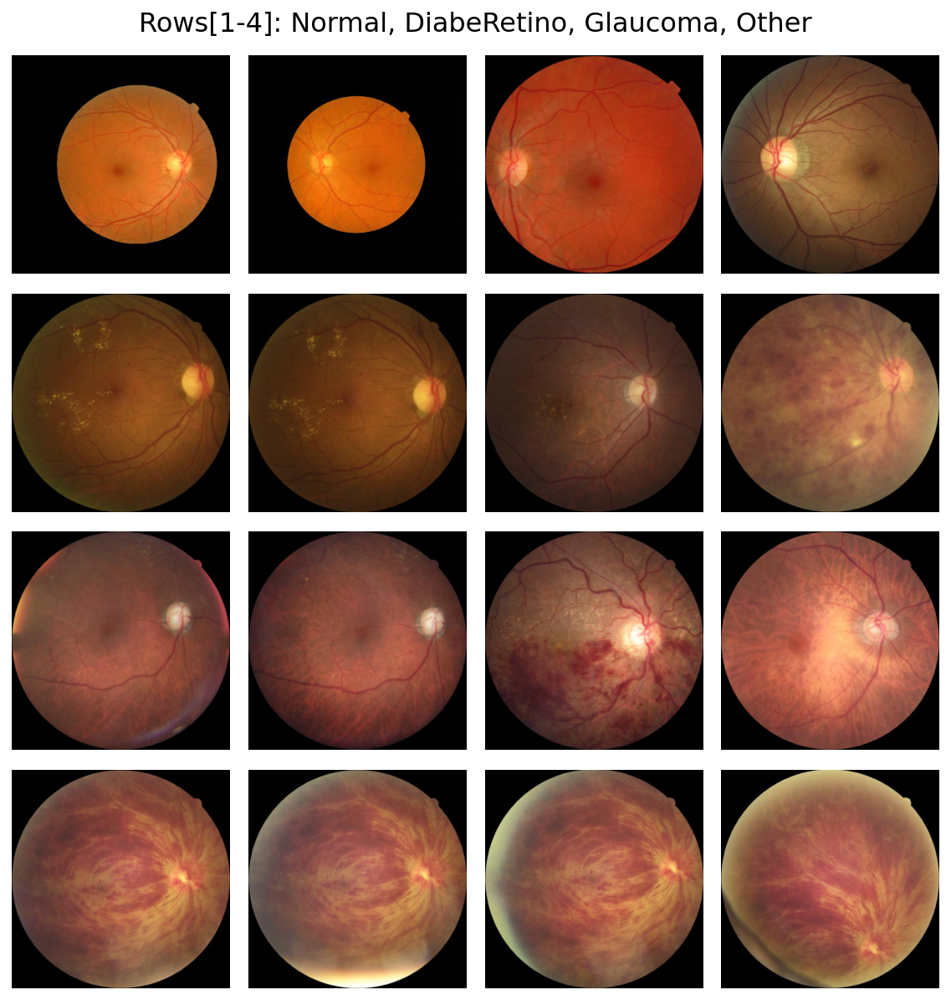

In [12]:
OFFS = 4 * 1
h.show_imgs(
    [plt.imread(RGB_DIR + TRAIN_DIR + fname) for fname in train_files['Normal'][OFFS:OFFS+4]] +
    [plt.imread(RGB_DIR + TRAIN_DIR + fname) for fname in train_files['DiabeRetino'][OFFS:OFFS+4]] +
    [plt.imread(RGB_DIR + TRAIN_DIR + fname) for fname in train_files['Glaucoma'][OFFS:OFFS+4]] + 
    [plt.imread(RGB_DIR + TRAIN_DIR + fname) for fname in train_files['Other'][OFFS:OFFS+4]],
    'Rows[1-4]: Normal, DiabeRetino, Glaucoma, Other'
)

## 2. Data Preprocessing

Check ALL files referenced in CSV: i. Exist ii. Not Corrupted iii. Expected Dimensions (WxHxD)

In [13]:
for fname in df_csv['filename']:
    f = open(DATA_DIR + TRAIN_DIR + fname, 'rb')
    assert b'JFIF' in f.peek(10)
    f.close()
    
    img = plt.imread(DATA_DIR + TRAIN_DIR + fname)
    assert img.shape == RAW_IMG_SIZE

### 2.1 Examine RGB Channels

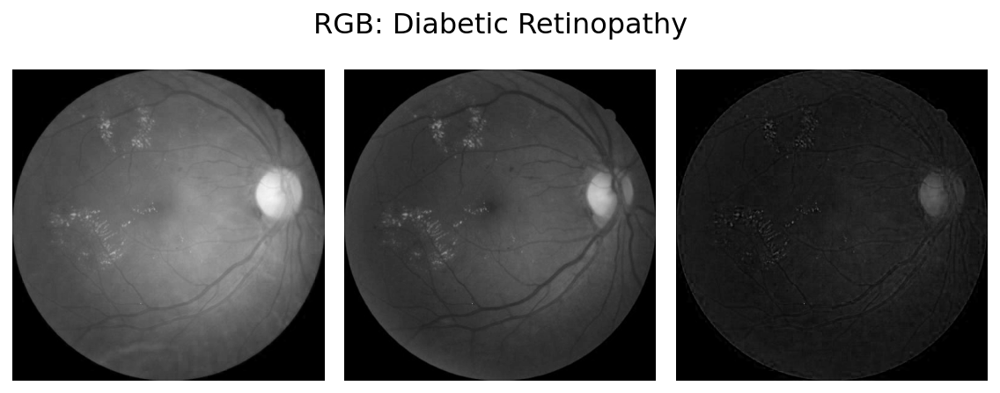

In [14]:
img = plt.imread(RGB_DIR + TRAIN_DIR + train_files['DiabeRetino'][OFFS])
h.show_imgs_chs([img], 'RGB: Diabetic Retinopathy')

### 2.1 Perform Contrast Enhancement using CLAHE

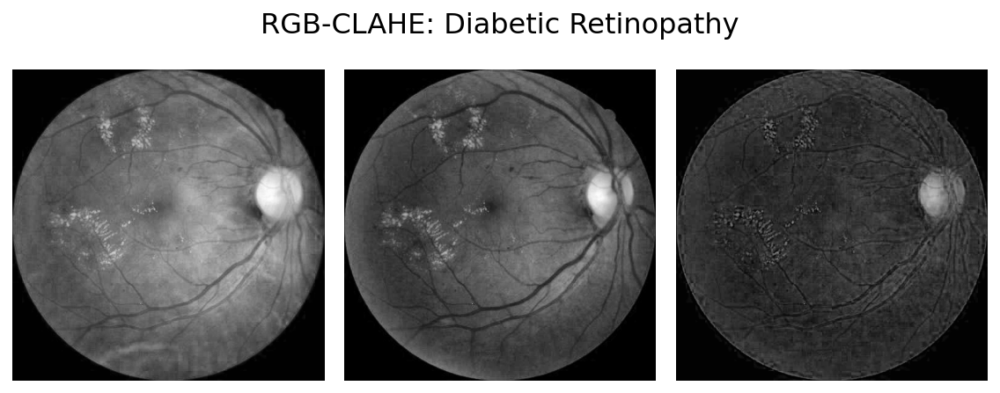

In [15]:
h.show_imgs_chs([h.clahe(img, 2)], 'RGB-CLAHE: Diabetic Retinopathy')

The hard exudates (leaked proteins and lipids) are clearly visible in the Red and Green enhanced channels.

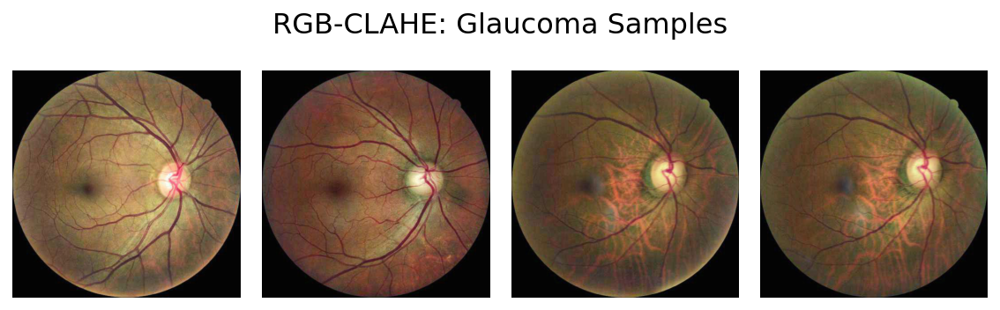

In [16]:
h.show_imgs(
    [plt.imread(DATA_DIR + TRAIN_DIR + fname) for fname in train_files['Glaucoma'][:4]],
    'RGB-CLAHE: Glaucoma Samples'
)

Clearly (haha!), the CLAHE enhanced images are showing features more clearly. Testing with the models confirm this, with a ~1.5% F1-score improvement noted empirically. As such, well be using RGB-CLAHE enhanced images going forward. Due to the complex calculations required for the CLAHE, the images for training will be pre-processed to avoid training slowdowns.

### 2.2 Other Transformations

I also tried color transformations such as HSI (matches the response of the human eye), as well application of a homomorphic filter (to even out illumination across the eye), but they did not provide a performance boost during training. These transformations are documented in the notebook _Midterm_Preprocessing.ipynb_ for reference.

<hr>

## 3. Data Ingestion and Augmentation

In [17]:
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator, DirectoryIterator

Validation images will not be modified other than range scaling. Due to GPU memory constraints and very long training times, I decided to resize the target image size to (256, 256).

In [18]:
valid_aug = {
    'rescale': 1/255,
    'validation_split': 0.3
}
valid_idg = ImageDataGenerator(**valid_aug)
valid_iter = valid_idg.flow_from_dataframe(
    df, directory=DATA_DIR + TRAIN_DIR, target_size=IMG_SIZE[:2],
    x_col='Filename', y_col=disorders, class_mode='raw',
    shuffle=True, seed=RAND_SEED, subset='validation'
)

Found 1030 validated image filenames.


Training images will be augmented using random: zooming, brightness adjustment, rotation, horz/vert flips, horz/vert translation. These were selected as they represent expected variations in real-life images, and do not significantly distort visual features that may be key to correct classification.

In [19]:
train_aug = {
    **valid_aug,
    'zoom_range': [1.0, 1.08],
    'brightness_range': [0.95, 1.05],
    'rotation_range': 20,
    'horizontal_flip': True,
    'vertical_flip': True,
    'width_shift_range': 0.08,
    'height_shift_range': 0.08,
    'fill_mode': 'constant'
}
train_idg = ImageDataGenerator(**train_aug)
train_iter = train_idg.flow_from_dataframe(
    df, directory=DATA_DIR + TRAIN_DIR, target_size=IMG_SIZE[:2],
    x_col='Filename', y_col=disorders, class_mode='raw',
    shuffle=True, seed=RAND_SEED, subset='training'
)

Found 2405 validated image filenames.


Check training data for correct input dimensions and labels are indeed non-exclusive (i.e. can sum to > 1)

In [20]:
train = next(train_iter)
print(train[1].sum(axis=1))
train[0].shape, train[1].shape, train[0].dtype, train[1].dtype

[0 1 1 0 1 1 0 1 1 1 2 1 1 0 0 1 0 1 1 2 1 1 1 1 1 0 2 1 1 2 2 1]


((32, 256, 256, 3), (32, 3), dtype('float32'), dtype('int64'))

In [21]:
valid = next(valid_iter)
print(valid[1].sum(axis=1))
valid[0].shape, valid[1].shape, valid[0].dtype, valid[1].dtype

[2 2 2 1 2 1 1 2 1 2 2 1 1 1 1 1 2 1 2 1 1 2 1 1 2 1 1 2 2 1 1 2]


((32, 256, 256, 3), (32, 3), dtype('float32'), dtype('int64'))

### 3.1 View random data augmentations

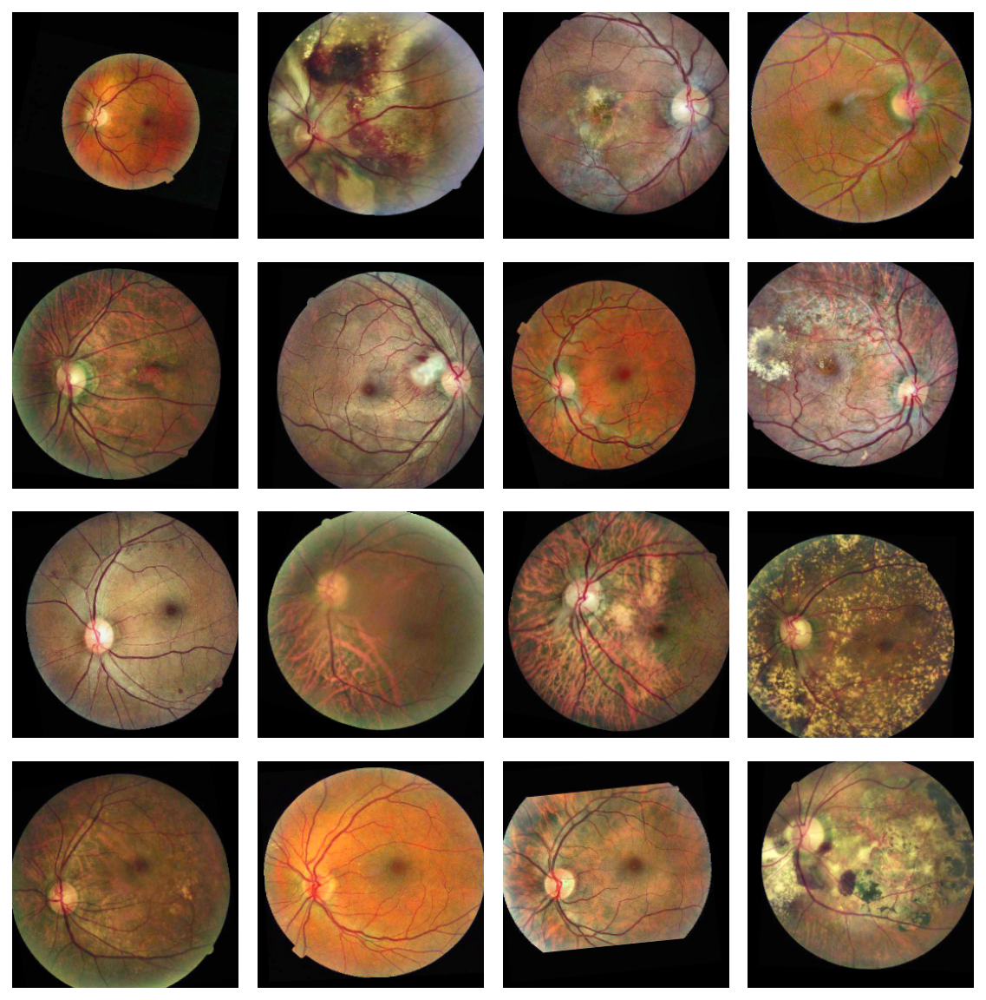

In [22]:
h.show_imgs(train[0][:16])

## 4. Modeling

In [23]:
# This model uses residual connections
def make_model_A(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    x = Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    previous_block_activation = x      # Set aside residual

    for size in [128, 256]:
        x = Activation("relu")(x)
        x = SeparableConv2D(size, 3, padding="same")(x)
        x = BatchNormalization()(x)

        x = Activation("relu")(x)
        x = SeparableConv2D(size, 3, padding="same")(x)
        x = BatchNormalization()(x)

        x = MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = Conv2D(size, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = add([x, residual])         # Add back residual
        previous_block_activation = x  # Set aside next residual

    x = SeparableConv2D(512, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = GlobalAveragePooling2D()(x)

    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation="sigmoid")(x)
    return Model(inputs, outputs)

In [24]:
# This model uses only sequential connections
def make_model_B(input_shape, num_classes):
    model = Sequential([
        Input(shape=input_shape),

        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(1e-4)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(1e-4)),
        AveragePooling2D(pool_size=(2, 2)),
        Dropout(0.15),

        BatchNormalization(),
        Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(1e-4)),
        BatchNormalization(),
        Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(1e-4)),
        AveragePooling2D (pool_size=(2, 2)),
        Dropout(0.2),

        BatchNormalization(),
        Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(1e-4)),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(1e-4)),
        MaxPooling2D (pool_size=(2, 2)),
        GlobalMaxPooling2D(),
        Dropout(0.25),

        BatchNormalization(),
        Dense(num_classes, activation='sigmoid')
    ])
    return model

In [25]:
from collections import defaultdict

# Fit <model> using <optimizer> and <class_weight>
# while accumulating histories
def fit(learning_rate, epochs, reset_hist=False):
    if reset_hist:
        fit.history = defaultdict(lambda: [])
    
    optimizer.lr.assign(learning_rate)
    history = model.fit(train_iter, validation_data=valid_iter,
                        class_weight=class_weight, verbose=2,
                        epochs=epochs)
    for metric, values in history.history.items():
        fit.history[metric].extend(values)
    return history

In [26]:
# Plot Training-vs-Validation Metrics
def plot_fit():
    # first two log entries will be skipped to not skew y-scale
    plt.figure(figsize=(12, 4))
    ax = plt.subplot(1, 2, 1)
    ax.set_title('Training Loss, Validation Loss');
    ax.plot(fit.history['loss'][2:], label='Train')
    ax.plot(fit.history['val_loss'][2:], label='Valid')
    ax.legend()
    
    ax = plt.subplot(1, 2, 2)
    ax.set_title('Training F1, Validation F1');
    ax.plot(fit.history['f1_score'][2:], label='Train')
    ax.plot(fit.history['val_f1_score'][2:], label='Valid')
    ax.legend()

#### Model Evaluation Metrics

In [27]:
f1 = F1Score(num_classes=valid_iter.labels.shape[-1],
             average='micro', threshold=SIG_THRESH)
precision = Precision(thresholds=SIG_THRESH)
recall = Recall(thresholds=SIG_THRESH)

SIG_THRESH was chosen to balance overall Precision-vs-Recall (i.e. maximize F1)

In [28]:
class_weight = {0: 0.36, 1: 0.42, 2: 0.22}

Skew class weights slightly to compensate for severe class imbalances

### 4.1 Model-A Results

In [29]:
keras.backend.clear_session()
train_iter.batch_size = valid_iter.batch_size = 64

model = make_model_A(IMG_SIZE, len(disorders))
optimizer = Adam()
model.compile(loss=BinaryCrossentropy(from_logits=False, label_smoothing=0.1),
              optimizer=optimizer,
              metrics=['accuracy', precision, recall, f1])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 128, 128, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

Train using Adam optimizer with decreasing learning-rates, stepping every time when training loss plateaus.

In [30]:
fit(1e-2, 4, reset_hist=True);

Epoch 1/4
38/38 - 37s - loss: 0.1866 - accuracy: 0.4395 - precision: 0.5488 - recall: 0.6696 - f1_score: 0.6032 - val_loss: 0.6342 - val_accuracy: 0.5330 - val_precision: 0.5545 - val_recall: 0.8513 - val_f1_score: 0.6716
Epoch 2/4
38/38 - 32s - loss: 0.1744 - accuracy: 0.4466 - precision: 0.5720 - recall: 0.7270 - f1_score: 0.6403 - val_loss: 0.6541 - val_accuracy: 0.5340 - val_precision: 0.5078 - val_recall: 0.7743 - val_f1_score: 0.6134
Epoch 3/4
38/38 - 31s - loss: 0.1714 - accuracy: 0.4561 - precision: 0.5940 - recall: 0.7143 - f1_score: 0.6487 - val_loss: 0.7224 - val_accuracy: 0.5146 - val_precision: 0.4929 - val_recall: 0.8326 - val_f1_score: 0.6192
Epoch 4/4
38/38 - 31s - loss: 0.1671 - accuracy: 0.4657 - precision: 0.6143 - recall: 0.7359 - f1_score: 0.6696 - val_loss: 0.6254 - val_accuracy: 0.5330 - val_precision: 0.4334 - val_recall: 0.9993 - val_f1_score: 0.6046


In [31]:
fit(1e-3, 12);

Epoch 1/12
38/38 - 31s - loss: 0.1636 - accuracy: 0.4615 - precision: 0.6123 - recall: 0.7776 - f1_score: 0.6851 - val_loss: 0.5876 - val_accuracy: 0.5330 - val_precision: 0.5179 - val_recall: 0.8991 - val_f1_score: 0.6572
Epoch 2/12
38/38 - 31s - loss: 0.1605 - accuracy: 0.4665 - precision: 0.6324 - recall: 0.7717 - f1_score: 0.6952 - val_loss: 0.5961 - val_accuracy: 0.5330 - val_precision: 0.5254 - val_recall: 0.8132 - val_f1_score: 0.6383
Epoch 3/12
38/38 - 31s - loss: 0.1591 - accuracy: 0.4753 - precision: 0.6307 - recall: 0.7869 - f1_score: 0.7002 - val_loss: 0.5663 - val_accuracy: 0.5437 - val_precision: 0.6143 - val_recall: 0.7773 - val_f1_score: 0.6862
Epoch 4/12
38/38 - 31s - loss: 0.1591 - accuracy: 0.4736 - precision: 0.6347 - recall: 0.7932 - f1_score: 0.7052 - val_loss: 0.5823 - val_accuracy: 0.5515 - val_precision: 0.7061 - val_recall: 0.7309 - val_f1_score: 0.7183
Epoch 5/12
38/38 - 31s - loss: 0.1583 - accuracy: 0.4723 - precision: 0.6430 - recall: 0.7675 - f1_score: 0.

In [32]:
fit(1e-4, 8);

Epoch 1/8
38/38 - 31s - loss: 0.1568 - accuracy: 0.4869 - precision: 0.6329 - recall: 0.8105 - f1_score: 0.7108 - val_loss: 0.5791 - val_accuracy: 0.5709 - val_precision: 0.7987 - val_recall: 0.6614 - val_f1_score: 0.7236
Epoch 2/8
38/38 - 32s - loss: 0.1567 - accuracy: 0.4898 - precision: 0.6412 - recall: 0.7962 - f1_score: 0.7103 - val_loss: 0.5522 - val_accuracy: 0.5718 - val_precision: 0.7432 - val_recall: 0.7549 - val_f1_score: 0.7490
Epoch 3/8
38/38 - 31s - loss: 0.1557 - accuracy: 0.4936 - precision: 0.6420 - recall: 0.8089 - f1_score: 0.7158 - val_loss: 0.5530 - val_accuracy: 0.5670 - val_precision: 0.7416 - val_recall: 0.7549 - val_f1_score: 0.7481
Epoch 4/8
38/38 - 31s - loss: 0.1555 - accuracy: 0.4807 - precision: 0.6422 - recall: 0.8042 - f1_score: 0.7141 - val_loss: 0.5450 - val_accuracy: 0.5689 - val_precision: 0.7234 - val_recall: 0.7818 - val_f1_score: 0.7514
Epoch 5/8
38/38 - 31s - loss: 0.1550 - accuracy: 0.4865 - precision: 0.6472 - recall: 0.8059 - f1_score: 0.7179 

In [33]:
fit(1e-5, 8);

Epoch 1/8
38/38 - 31s - loss: 0.1548 - accuracy: 0.4840 - precision: 0.6401 - recall: 0.8046 - f1_score: 0.7130 - val_loss: 0.5414 - val_accuracy: 0.5670 - val_precision: 0.7044 - val_recall: 0.7960 - val_f1_score: 0.7474
Epoch 2/8
38/38 - 31s - loss: 0.1547 - accuracy: 0.4902 - precision: 0.6405 - recall: 0.8051 - f1_score: 0.7134 - val_loss: 0.5411 - val_accuracy: 0.5670 - val_precision: 0.7044 - val_recall: 0.7945 - val_f1_score: 0.7468
Epoch 3/8
38/38 - 31s - loss: 0.1556 - accuracy: 0.4877 - precision: 0.6397 - recall: 0.7987 - f1_score: 0.7105 - val_loss: 0.5413 - val_accuracy: 0.5650 - val_precision: 0.7042 - val_recall: 0.7937 - val_f1_score: 0.7463
Epoch 4/8
38/38 - 32s - loss: 0.1554 - accuracy: 0.4761 - precision: 0.6489 - recall: 0.8034 - f1_score: 0.7179 - val_loss: 0.5400 - val_accuracy: 0.5650 - val_precision: 0.7036 - val_recall: 0.7967 - val_f1_score: 0.7473
Epoch 5/8
38/38 - 31s - loss: 0.1552 - accuracy: 0.4827 - precision: 0.6418 - recall: 0.8013 - f1_score: 0.7127 

In [34]:
fit(1e-6, 4);

Epoch 1/4
38/38 - 31s - loss: 0.1543 - accuracy: 0.4832 - precision: 0.6438 - recall: 0.8084 - f1_score: 0.7168 - val_loss: 0.5394 - val_accuracy: 0.5670 - val_precision: 0.7029 - val_recall: 0.7975 - val_f1_score: 0.7472
Epoch 2/4
38/38 - 31s - loss: 0.1549 - accuracy: 0.4815 - precision: 0.6413 - recall: 0.8063 - f1_score: 0.7144 - val_loss: 0.5395 - val_accuracy: 0.5670 - val_precision: 0.7027 - val_recall: 0.7967 - val_f1_score: 0.7468
Epoch 3/4
38/38 - 31s - loss: 0.1545 - accuracy: 0.4881 - precision: 0.6390 - recall: 0.8042 - f1_score: 0.7121 - val_loss: 0.5394 - val_accuracy: 0.5670 - val_precision: 0.7032 - val_recall: 0.7967 - val_f1_score: 0.7470
Epoch 4/4
38/38 - 31s - loss: 0.1547 - accuracy: 0.4844 - precision: 0.6397 - recall: 0.8114 - f1_score: 0.7154 - val_loss: 0.5396 - val_accuracy: 0.5670 - val_precision: 0.7036 - val_recall: 0.7967 - val_f1_score: 0.7473


In [35]:
model.evaluate(valid_iter)

17/17 [==============================] - 3s 149ms/step - loss: 0.5396 - accuracy: 0.5670 - precision: 0.7036 - recall: 0.7967 - f1_score: 0.7473


[0.540, 0.567, 0.704, 0.797, 0.747]

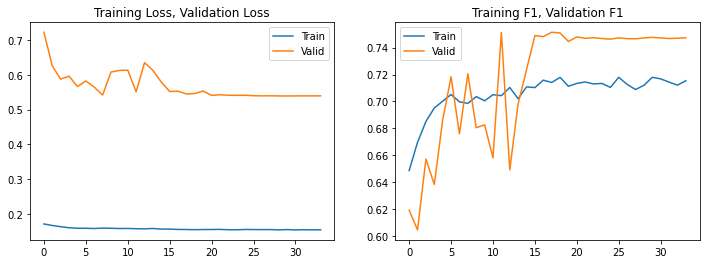

In [36]:
plot_fit()

We observe that:
- At the end of training, training loss and F1 score have plateaued (i.e. optimal model bias achieved)
- At the end of training, validation score has been stable for many epochs (i.e. model is robust)
- The model is not overfiting since the validation score flatlined and did not start increasing
- Validation loss is much higher Training Loss, perhaps due to data augmentation during training, or validation distribution being unmatched to training distribution

In [37]:
h.disp_multilabel_stats(model, disorders, valid_iter, SIG_THRESH)

.................
Total Samples: 1030
Total Positives: 1344 (Actual), 1526 (Predict)
CLASS:  ACTUAL#, PREDICT#
DiabeRetino    : 293, 219
Glaucoma       : 206, 296
Other          : 845, 1011


In [38]:
model.save('ModelA')

#### 4.1.1 Hyperparameters Tuning

(Notebooks/Code/Output for inferior hyperparameter runs not included for NB readability)  

| Change | Train Loss | Valid Loss | Valid Precis | Valid Recall | Train F1 | Valid F1 |
| ------ | ---------- | ---------- | -------------| --------------| -------- | -------- |
| Default (shown in code)          | .155 | .540 | 70.4 | 79.7 | 71.5 | 74.7 |
| Data Aug: 1.5X Rotation/X-lation   | .152 | .538 | 72.9 | 77.0 | 72.6 | 74.9 |
| Dropout: 0.4 => 0.2              | .152 | .532 | 71.1 | 79.8 | 72.3 | 75.2 |
| L1 Conv2D # Filts: 32 => 64      | .155 | .537 | 69.1 | 80.2 | 71.5 | 74.2 |

### 4.2 Model-B Results

In [39]:
keras.backend.clear_session()
train_iter.batch_size = valid_iter.batch_size = 64

model = make_model_B(IMG_SIZE, len(disorders))
optimizer = Adam()
model.compile(loss=BinaryCrossentropy(from_logits=False),
              optimizer=optimizer,
              metrics=['accuracy', precision, recall, f1])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 254, 254, 32)      128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 252, 252, 32)      9248      
_________________________________________________________________
average_pooling2d (AveragePo (None, 126, 126, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 126, 126, 32)      0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 126, 126, 32)      128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 126, 126, 64)      1

Train using Adam optimizer with decreasing learning-rates, stepping every time when training loss plateaus.

In [40]:
fit(1e-2, 4, reset_hist=True);

Epoch 1/4
38/38 - 28s - loss: 0.2674 - accuracy: 0.4220 - precision: 0.5699 - recall: 0.7249 - f1_score: 0.6381 - val_loss: 4.4648 - val_accuracy: 0.1854 - val_precision: 0.1932 - val_recall: 0.1487 - val_f1_score: 0.1681
Epoch 2/4
38/38 - 27s - loss: 0.2271 - accuracy: 0.4869 - precision: 0.5988 - recall: 0.6882 - f1_score: 0.6404 - val_loss: 0.5877 - val_accuracy: 0.5398 - val_precision: 0.5114 - val_recall: 0.9230 - val_f1_score: 0.6581
Epoch 3/4
38/38 - 27s - loss: 0.1920 - accuracy: 0.4769 - precision: 0.6224 - recall: 0.7190 - f1_score: 0.6672 - val_loss: 0.5685 - val_accuracy: 0.5330 - val_precision: 0.5574 - val_recall: 0.8498 - val_f1_score: 0.6732
Epoch 4/4
38/38 - 27s - loss: 0.1734 - accuracy: 0.5010 - precision: 0.6357 - recall: 0.7283 - f1_score: 0.6789 - val_loss: 0.5629 - val_accuracy: 0.5330 - val_precision: 0.6082 - val_recall: 0.7960 - val_f1_score: 0.6895


In [41]:
fit(1e-3, 12);

Epoch 1/12
38/38 - 27s - loss: 0.1654 - accuracy: 0.5089 - precision: 0.6212 - recall: 0.7772 - f1_score: 0.6905 - val_loss: 0.5508 - val_accuracy: 0.5330 - val_precision: 0.8243 - val_recall: 0.6345 - val_f1_score: 0.7171
Epoch 2/12
38/38 - 27s - loss: 0.1583 - accuracy: 0.5268 - precision: 0.6589 - recall: 0.7671 - f1_score: 0.7089 - val_loss: 0.5491 - val_accuracy: 0.5330 - val_precision: 0.8243 - val_recall: 0.6345 - val_f1_score: 0.7171
Epoch 3/12
38/38 - 27s - loss: 0.1556 - accuracy: 0.5326 - precision: 0.6675 - recall: 0.7591 - f1_score: 0.7104 - val_loss: 0.5425 - val_accuracy: 0.5330 - val_precision: 0.8243 - val_recall: 0.6345 - val_f1_score: 0.7171
Epoch 4/12
38/38 - 26s - loss: 0.1522 - accuracy: 0.5164 - precision: 0.6655 - recall: 0.7532 - f1_score: 0.7067 - val_loss: 0.5414 - val_accuracy: 0.5330 - val_precision: 0.8243 - val_recall: 0.6345 - val_f1_score: 0.7171
Epoch 5/12
38/38 - 26s - loss: 0.1501 - accuracy: 0.5119 - precision: 0.6710 - recall: 0.7624 - f1_score: 0.

In [42]:
fit(1e-4, 8);

Epoch 1/8
38/38 - 26s - loss: 0.1414 - accuracy: 0.4973 - precision: 0.6961 - recall: 0.7616 - f1_score: 0.7274 - val_loss: 0.4859 - val_accuracy: 0.5379 - val_precision: 0.7979 - val_recall: 0.7257 - val_f1_score: 0.7601
Epoch 2/8
38/38 - 26s - loss: 0.1404 - accuracy: 0.5081 - precision: 0.7010 - recall: 0.7764 - f1_score: 0.7367 - val_loss: 0.4832 - val_accuracy: 0.5369 - val_precision: 0.7666 - val_recall: 0.7511 - val_f1_score: 0.7588
Epoch 3/8
38/38 - 26s - loss: 0.1383 - accuracy: 0.5131 - precision: 0.6904 - recall: 0.7781 - f1_score: 0.7316 - val_loss: 0.4800 - val_accuracy: 0.5369 - val_precision: 0.7673 - val_recall: 0.7616 - val_f1_score: 0.7644
Epoch 4/8
38/38 - 26s - loss: 0.1369 - accuracy: 0.5210 - precision: 0.6950 - recall: 0.7865 - f1_score: 0.7379 - val_loss: 0.4726 - val_accuracy: 0.5388 - val_precision: 0.7736 - val_recall: 0.7608 - val_f1_score: 0.7671
Epoch 5/8
38/38 - 26s - loss: 0.1374 - accuracy: 0.5222 - precision: 0.7005 - recall: 0.7797 - f1_score: 0.7380 

In [43]:
fit(1e-5, 8);

Epoch 1/8
38/38 - 26s - loss: 0.1356 - accuracy: 0.5177 - precision: 0.6965 - recall: 0.7806 - f1_score: 0.7362 - val_loss: 0.4628 - val_accuracy: 0.5505 - val_precision: 0.7512 - val_recall: 0.7900 - val_f1_score: 0.7701
Epoch 2/8
38/38 - 26s - loss: 0.1343 - accuracy: 0.5289 - precision: 0.7018 - recall: 0.7924 - f1_score: 0.7444 - val_loss: 0.4610 - val_accuracy: 0.5515 - val_precision: 0.7608 - val_recall: 0.7870 - val_f1_score: 0.7737
Epoch 3/8
38/38 - 26s - loss: 0.1361 - accuracy: 0.5356 - precision: 0.6947 - recall: 0.7873 - f1_score: 0.7381 - val_loss: 0.4601 - val_accuracy: 0.5505 - val_precision: 0.7657 - val_recall: 0.7765 - val_f1_score: 0.7711
Epoch 4/8
38/38 - 26s - loss: 0.1353 - accuracy: 0.5260 - precision: 0.7018 - recall: 0.7857 - f1_score: 0.7414 - val_loss: 0.4595 - val_accuracy: 0.5495 - val_precision: 0.7700 - val_recall: 0.7780 - val_f1_score: 0.7740
Epoch 5/8
38/38 - 26s - loss: 0.1353 - accuracy: 0.5281 - precision: 0.7054 - recall: 0.7840 - f1_score: 0.7426 

In [44]:
fit(1e-6, 4);

Epoch 1/4
38/38 - 27s - loss: 0.1351 - accuracy: 0.5210 - precision: 0.7042 - recall: 0.7806 - f1_score: 0.7404 - val_loss: 0.4604 - val_accuracy: 0.5680 - val_precision: 0.7749 - val_recall: 0.7743 - val_f1_score: 0.7746
Epoch 2/4
38/38 - 26s - loss: 0.1348 - accuracy: 0.5243 - precision: 0.7057 - recall: 0.7924 - f1_score: 0.7466 - val_loss: 0.4606 - val_accuracy: 0.5738 - val_precision: 0.7758 - val_recall: 0.7758 - val_f1_score: 0.7758
Epoch 3/4
38/38 - 26s - loss: 0.1353 - accuracy: 0.5231 - precision: 0.6992 - recall: 0.7886 - f1_score: 0.7412 - val_loss: 0.4607 - val_accuracy: 0.5748 - val_precision: 0.7767 - val_recall: 0.7773 - val_f1_score: 0.7770
Epoch 4/4
38/38 - 26s - loss: 0.1353 - accuracy: 0.5247 - precision: 0.7046 - recall: 0.7869 - f1_score: 0.7435 - val_loss: 0.4610 - val_accuracy: 0.5748 - val_precision: 0.7754 - val_recall: 0.7765 - val_f1_score: 0.7760


In [45]:
model.evaluate(valid_iter)

17/17 [==============================] - 2s 105ms/step - loss: 0.4610 - accuracy: 0.5748 - precision: 0.7754 - recall: 0.7765 - f1_score: 0.7760


[0.461, 0.575, 0.775, 0.777, 0.776]

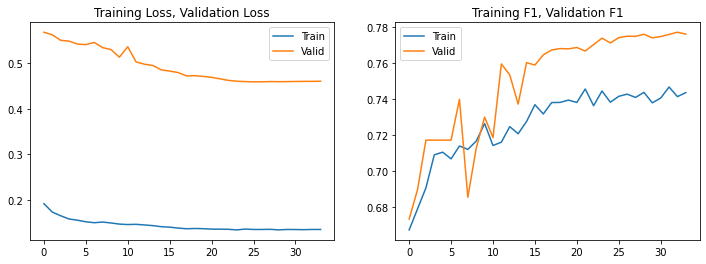

In [46]:
plot_fit()

We observe that:
- At the end of training, training loss and F1 score have plateaued (i.e. optimal model bias achieved)
- At the end of training, validation score has been stable for many epoch (i.e. model is robust)
- The model is not overfiting since the validation score flatlined and did not start increasing
- Validation loss is much higher Training Loss, perhaps due to data augmentation during training, or validation distribution being unmatched to training distribution

In [47]:
h.disp_multilabel_stats(model, disorders, valid_iter, SIG_THRESH)

.................
Total Samples: 1030
Total Positives: 1338 (Actual), 1345 (Predict)
CLASS:  ACTUAL#, PREDICT#
DiabeRetino    : 291, 254
Glaucoma       : 201, 122
Other          : 846, 969


In [48]:
model.save('ModelB')

#### 4.1.1 Hyperparameters Tuning

(Notebooks/Code/Output for these hyperparameter runs not included for NB readability)  


| Change | Train Loss | Valid Loss | Valid Precis | Valid Recall | Train F1 | Valid F1 |
| ------ | ---------- | ---------- | -------------| --------------| -------- | -------- |
| Default (shown in code)          | .135 | .461 | 77.5 | 77.6 | 74.4 | 77.6 |
| Data Aug: 2X Rotation/X-lation   | .135 | .471 | 76.7 | 77.1 | 74.4 | 76.9 |
| L10: GlobalMaxPooling2D => GlobalAvgPooling2D | .149 | .509 | 71.7 | 80.4 | 72.8 | 75.8 |
| L1 Conv2D Kernel: 3x3 => 5x5     | .140 | .486 | 77.5 | 73.9 | 72.7 | 75.6 |

### 4.3 Final Model Selection

ModelA is deeper and has more parameters than Model B, and is slower (to train). Model B was selected as the final model as it has lower Training and Validation Losses (i.e. lower bias), well-balanced Precision-vs-Recall (77.5% and 77.6% respectively), as well as higher (77.6%) F1 scores, well-matched between training and validation (i.e. lower variance).
<p>
Model class-specific scores are as follows:

In [49]:
h.disp_multilabel_scores(model, disorders, valid_iter, SIG_THRESH)

.................................
CLASS:    PRECISION, RECALL
DiabeRetino    : 57.3, 49.1
Glaucoma       : 60.5, 36.9
Other          : 85.3, 96.7


## 5. Visualization

In [50]:
model = keras.models.load_model('ModelB')
model.trainable = False

### 5.1 Samples Selection

We begin by selecting, for each disorder, 4 of the model's most confident True Positives that our chosen model classified. This will be useful to help us visualize strong features that the model feels is most strongly associated with each class of disorder.

In [51]:
# Return <num> most confident True Positive images of <klass>
def most_confident(model, klass, xy_iter, thresh, num):
    imgs = []
    for _ in range(len(xy_iter)):
        print('.', end='')
        x, y = next(xy_iter)
        preds = model.predict(x)
        for x, y, pred in zip(x, y, preds):
            if y[klass] and pred[klass] > thresh:
                imgs.append((pred[klass], x))
    print(f'\nFound {len(imgs)} True Positives for Class# {klass}')
    imgs.sort(key=lambda x: x[0], reverse=True)
    print('Confidences:', [f'{x[0]:.3f}' for x in imgs[:num]])
    return [tup[1] for tup in imgs[:num]]

In [52]:
best_tp = [most_confident(model, klass_idx, valid_iter, SIG_THRESH, 4)
           for klass_idx in range(len(disorders))]

.................................
Found 145 True Positives for Class# 0
Confidences: ['0.942', '0.913', '0.911', '0.898']
.................................
Found 75 True Positives for Class# 1
Confidences: ['0.869', '0.843', '0.840', '0.840']
.................................
Found 817 True Positives for Class# 2
Confidences: ['0.964', '0.961', '0.959', '0.958']


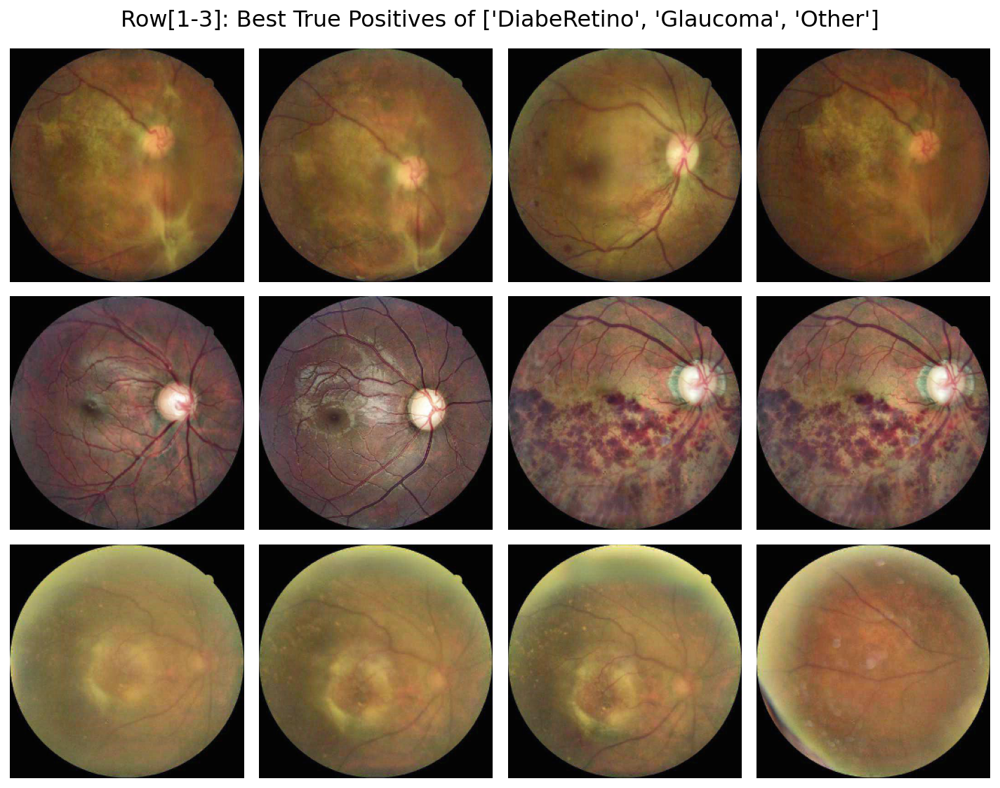

In [53]:
best_tp_flatten = [sample for disorder in best_tp for sample in disorder]
h.show_imgs(best_tp_flatten, f'Row[1-3]: Best True Positives of {disorders}',
            scale=1.25)

### 5.2 Saliency Heatmaps (Grad-CAM)

In [54]:
# Create Grad-CAM heatmap of single image
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [55]:
# Create <heatmap> superimposed on <img>
def superimpose_gradcam(img, heatmap, alpha=0.4):
    # Rescale img and heatmap to a range 0-255
    img = np.uint8(255 * img)
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    return (jet_heatmap * alpha + img).astype(np.uint8)

In [56]:
# Get Heatmaps from a list of Images
def get_heatmaps(model, imgs_list, conv_lyr_name, klass):
    heatmaps = []
    for img in imgs_list:
        assert isinstance(img, np.ndarray)
        x = tf.constant(np.expand_dims(img, axis=0))
        heatmaps.append(make_gradcam_heatmap(x, model, conv_lyr_name, klass))
    return heatmaps

In [57]:
# Get Superimpositions from a list of images and heatmaps
def get_superimps(imgs, heatmaps):
    return [superimpose_gradcam(img, heatmap)
            for img, heatmap in zip(imgs, heatmaps)]

In [58]:
# Get a 4x3 list of images, heatmaps and superimpositions to display
def get_gradcam_grid(model, imgs, conv_lyr_name, klass):
    output = imgs[:]
    imgs_np = np.array(imgs)
    heatmaps = get_heatmaps(model, imgs_np, conv_lyr_name, klass)
    output.extend(heatmaps)
    superimps = get_superimps(imgs_np, heatmaps)
    output.extend(superimps)
    return output

For Grad-CAM to work properly, the sigmoid final layer activations need to be disabled to expose the output gradients.

In [59]:
model_last_lyr_act = model.layers[-1].activation
model.layers[-1].activation = None

#### 5.2.1 Diabetic Retinopathy Heatmaps

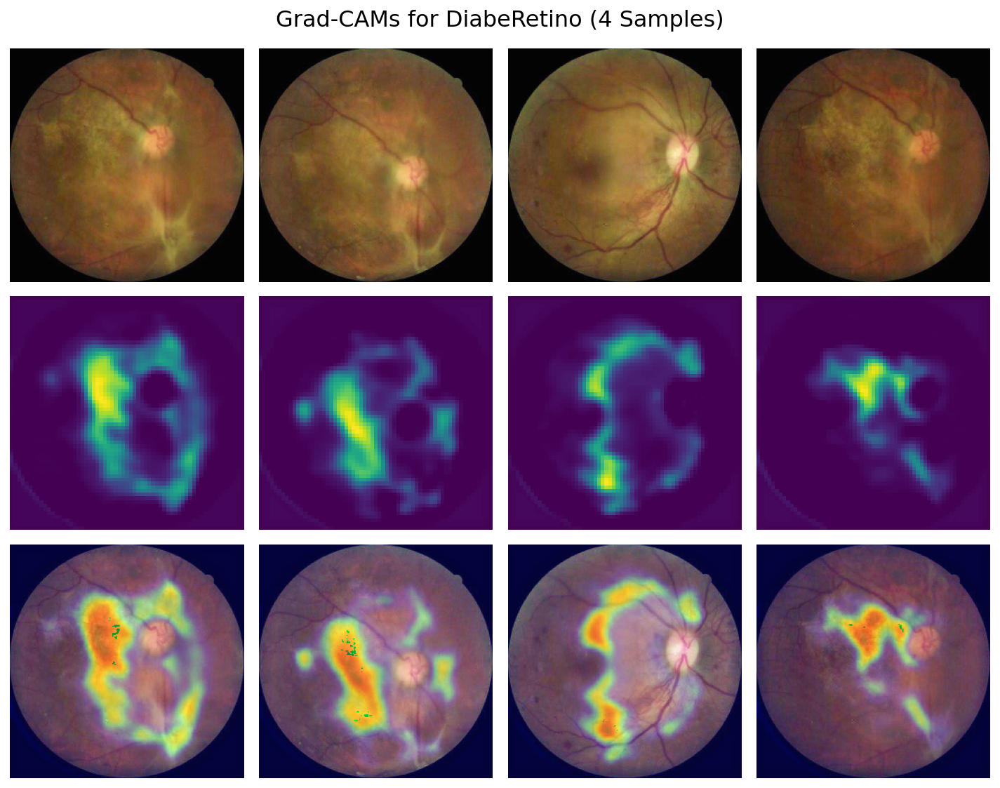

In [60]:
h.show_imgs(h.get_gradcam_grid(model, best_tp[0], 'conv2d_5', 0),
            f'Grad-CAMs for {disorders[0]} (4 Samples)', scale=1.25)

One pathalogy of Diabetic Retinopath is microaneurysms, which can be seen as tiny dark spots.

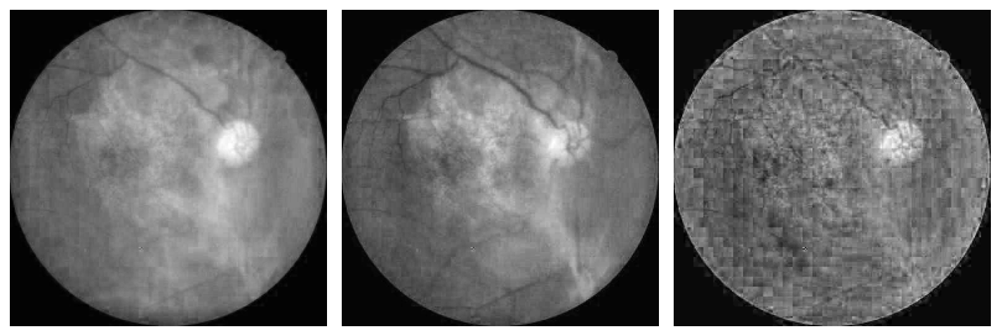

In [61]:
h.show_imgs_chs([best_tp[0][3]], scale=1.25)

Another clinical finding of DR is hard exudates, which show up as bright flecks. The above shows the RGB channels of Sample-4 (corresponding to right-most column in previous figure), and the flecks can be seen in the Green channel, and highlighted by the red region heatmap.

#### 5.2.2 Glaucoma Heatmaps

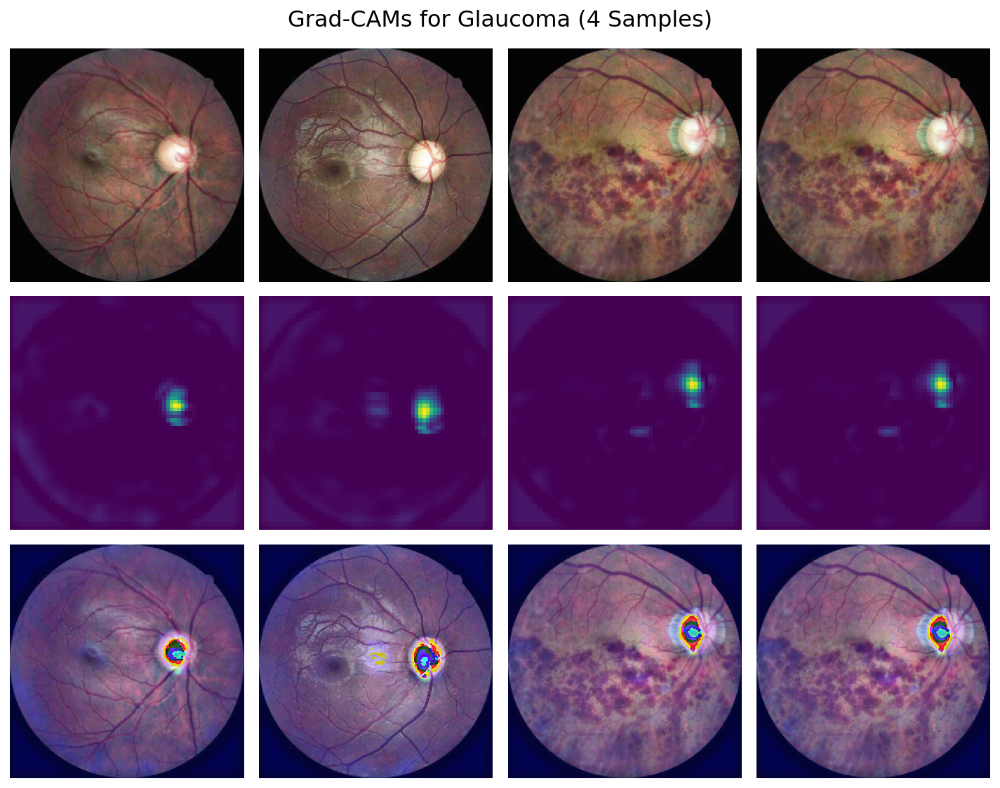

In [62]:
h.show_imgs(h.get_gradcam_grid(model, best_tp[1], 'conv2d_5', 1),
            f'Grad-CAMs for {disorders[1]} (4 Samples)', scale=1.25)

The pathology of Glaucoma is characterized by cupping of the optic nerve. The cup of the optic nerve is filled with glial tissue, which gives it a marked paleness. Glaucoma is evidenced with the cup to optic disk ratio is large, meaning the cup fills most of the optic disk. This is shown in the heatmaps, which not only zeroes in on the optic disk, but the red regions dilineate the neuro retinal rim, which is the margin between the optic cup and and the optic disk (glaucoma is indicated when there is diminished margin).

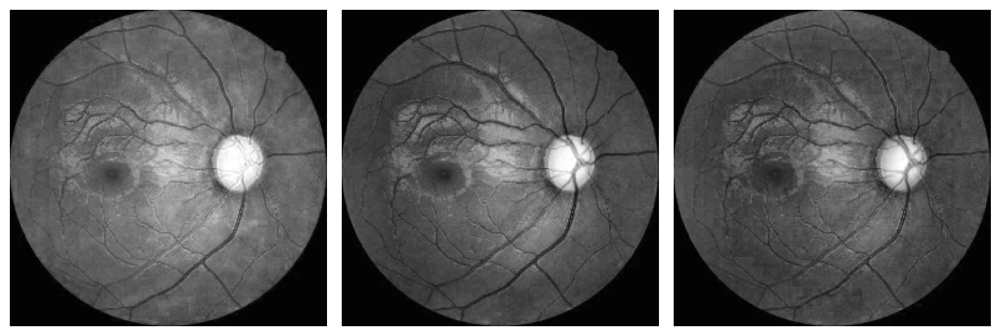

In [63]:
h.show_imgs_chs([best_tp[1][1]], scale=1.25)

The large cup-to-disk ratio of Sample-2 is clearly evidenced.

#### 5.2.3 'Other' Heatmaps

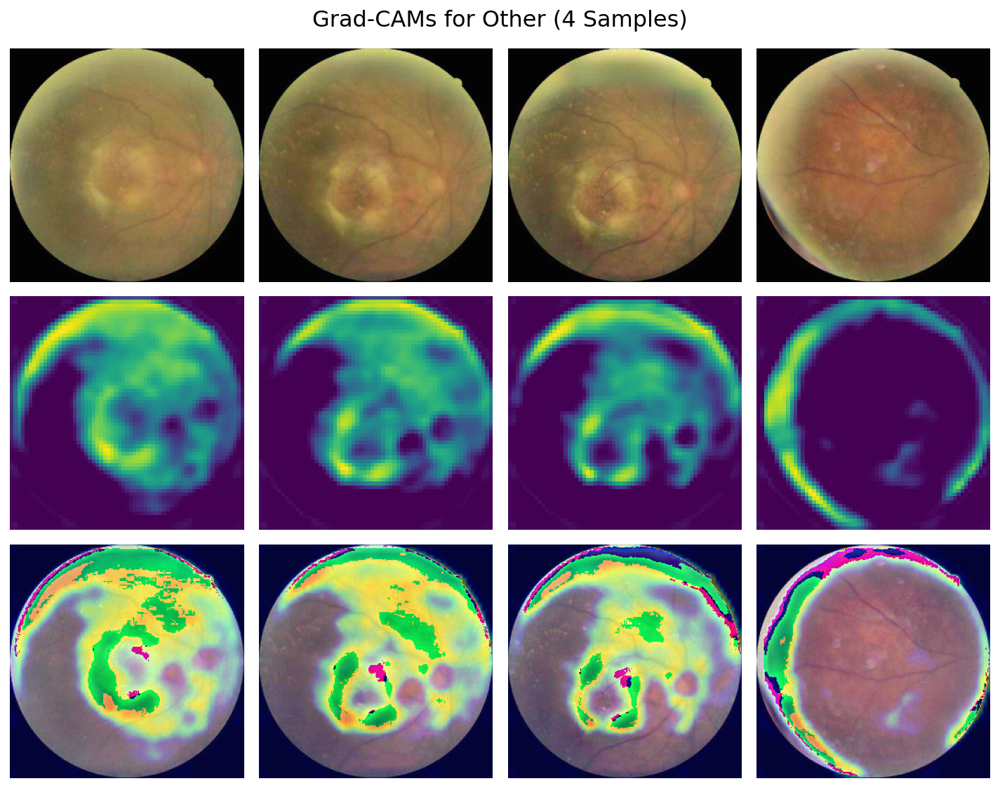

In [64]:
h.show_imgs(h.get_gradcam_grid(model, best_tp[2], 'conv2d_5', 2),
            f'Grad-CAMs for {disorders[2]} (4 Samples)', scale=1.25)

The most common disorder in the 'Other' group is opacity. The heatmaps picked up on this by highlighting the 'blurry' or opaque regions in the periphery of these fundus images.

### 5.3 Activation Maps

We'll first select a 'Normal' image to use for probing the activation maps of our CNN.

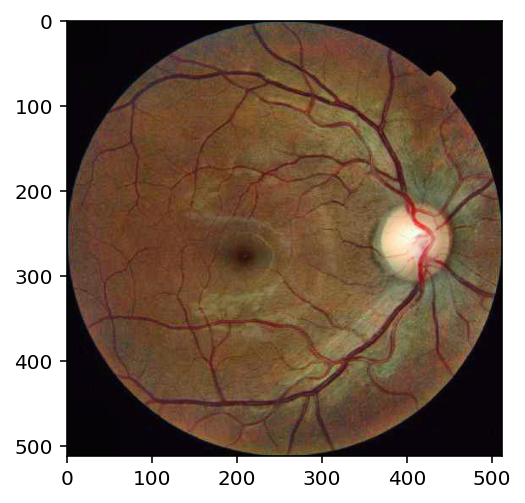

In [65]:
img = Image.open(DATA_DIR + TRAIN_DIR + train_files['Normal'][0])
plt.imshow(img);

In [66]:
img = np.asarray(img.resize(IMG_SIZE[:2]))
img = np.expand_dims(img, axis=0)

In [67]:
def show_act(model, layer_name, img, limit=32):
    layer = [model.get_layer(layer_name).output]
    activation_model = Model(inputs=model.input, outputs=layer)
    activations = np.squeeze(activation_model.predict(img))
    h.show_activations(activations[..., :limit], cols=8, scale=1.5)

#### 5.3.1 First CNN Layer ('conv2d')

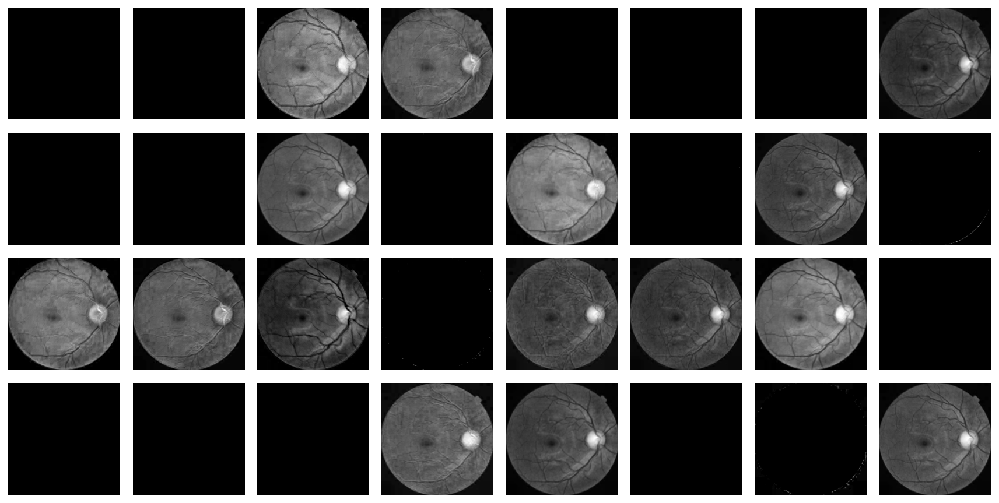

In [68]:
show_act(model, 'conv2d', img)

There appears to be a number of 'dead' channels ... this may be a result of too fast of a learning-rate, or unlucky weight initializations. It looks like the live channels all do unique transformations on the source image.

#### 5.3.1 Second Layer ('conv2d_1')

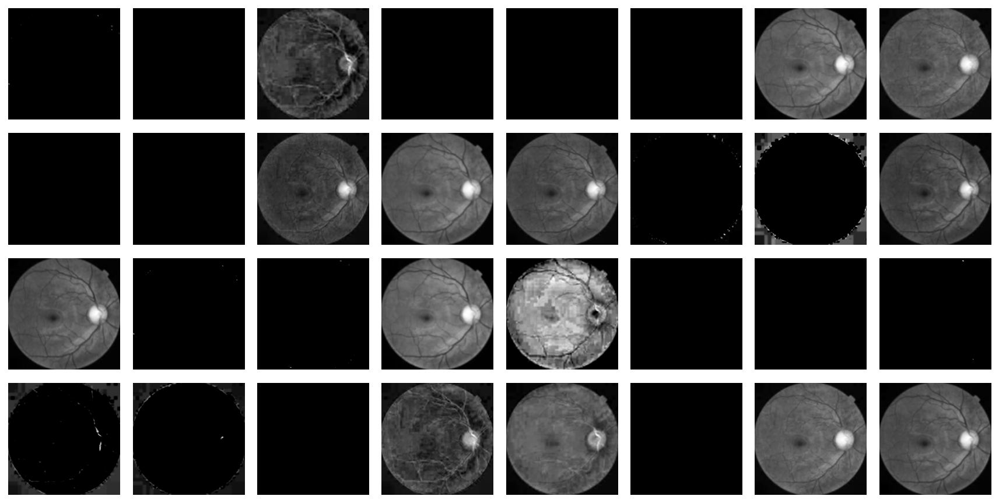

In [69]:
show_act(model, 'conv2d_1', img)

As expected, the transformations are more radical at this second layer. It looks like the lower-leftmost two are good for detecting the 'flecks' characteristic of hard exudates. The Macular and Fovea are especially pronounced in some activations.

#### 5.3.1 Last CNN Layer ('conv2d_5')

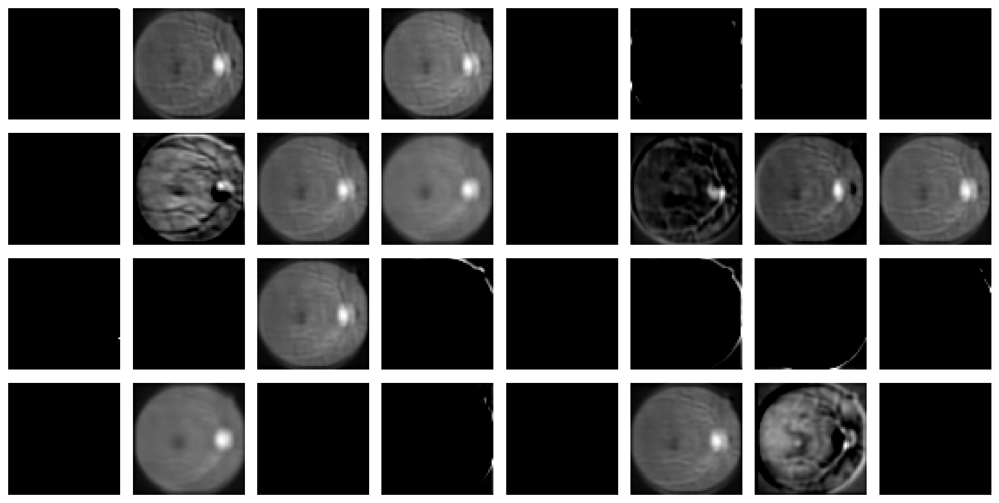

In [70]:
show_act(model, 'conv2d_5', img)

## 6. Semi-Supervised Learning

### 6.1 Extract Feature Vectors

In [29]:
# Class allowing use of DataImageGenerator while providing filenames
class ImageWithNames(DirectoryIterator):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.filenames_np = np.array(self.filepaths)
        self.class_mode = None # so that we only get the images back

    def _get_batches_of_transformed_samples(self, index_array):
        return (super()._get_batches_of_transformed_samples(index_array),
                self.filenames_np[index_array])

In [30]:
# Iterate over data iterator and gather feature embeddings along with
# corresponding filenames
def get_features(model, x_fpath_iter) -> None:
    feats = []
    fnames = []
    for _ in range(len(x_fpath_iter)):
        print('.', end='')
        x, fpath = next(x_fpath_iter)
        fnames.extend([fpath.split('/')[-1] for fpath in list(fpath)])
        feats.append(model.predict(x))
    feats = np.concatenate(feats)
    return fnames, feats

In [31]:
# Iterate over data iterator and gather features embeddings and ground
# truth labels, along with corresponding filenames
def get_features_labels(model, x_fpath_iter, df, classes) -> None:
    feats = []
    fnames = []
    labels = []
    for _ in range(len(x_fpath_iter)):
        print('.', end='')
        x, fpath = next(x_fpath_iter)
        fnames_batch = [fpath.split('/')[-1] for fpath in list(fpath)]
        fnames.extend(fnames_batch)
        for fname in fnames_batch:
            df_fname = df[df['Filename'] == fname]
            # there should be one and only one fname match
            assert len(df_fname) == 1
            ps = df_fname.iloc[0][disorders]
            y = np.array((ps[0], ps[1], ps[2])) # multi-hot encoding
            labels.append(y)
        feats.append(model.predict(x))
    feats = np.concatenate(feats)
    labels = np.stack(labels)
    return fnames, feats, labels

In [32]:
test_no_aug = {
    'rescale': 1/255,
}
test_idg = ImageDataGenerator(**test_no_aug)
test_iter = ImageWithNames(
    directory=DATA_DIR, image_data_generator=test_idg,
    target_size=IMG_SIZE[:2], classes=[TEST_DIR[:-1]],
    class_mode=None, shuffle=False, seed=RAND_SEED
)

Found 350 images belonging to 1 classes.


In [33]:
train_no_aug = {
    'rescale': 1/255,
    'validation_split': 0.3
}
train_idg = ImageDataGenerator(**train_no_aug)
train_iter = ImageWithNames(
    directory=DATA_DIR, image_data_generator=train_idg,
    target_size=IMG_SIZE[:2], classes=[TRAIN_DIR[:-1]],
    class_mode=None, shuffle=False, seed=RAND_SEED,
    subset='training'
)

Found 2405 images belonging to 1 classes.


NOTE: We do NOT use the Validation allotment of Train images for Label Propagation to avoid data leakage.

In [34]:
model = keras.models.load_model('ModelB')

#### Last Layer before Classification/Sigmoid: 'global_max_pooling2d'

In [35]:
output = model.get_layer('global_max_pooling2d').output
model_feat = Model(inputs=model.input, outputs=output)

In [36]:
# UnLaBeled Features and corresponding Filenames
fnames_ulb, feats_ulb = get_features(model_feat, test_iter)

...........

In [37]:
# LaBeLed Features, Labels and corresponding Filenames
fnames_lbl, feats_lbl, labels_lbl = get_features_labels(model_feat, train_iter, df, disorders)

............................................................................

In [38]:
feats = np.concatenate((feats_lbl, feats_ulb))
labels = np.concatenate((labels_lbl, np.full((len(feats_ulb), 3), -1)))
feats.shape, labels.shape

((2755, 128), (2755, 3))

2755 (2405 from Train + 350 from Test) Features-Labels ready for Label Propagation

### 6.2 Label Propagation (Spreading)

In [39]:
from sklearn.semi_supervised import LabelSpreading

lp_models = [LabelSpreading(gamma=.25, max_iter=20)] * len(disorders)
ulb_indices = np.arange(len(feats_lbl), len(feats))
y_hats = []
print('Positives Proportions:')
for klass, lp_model in enumerate(lp_models):
    lp_model.fit(feats, labels[:, klass])
    y_hat = lp_models[klass].transduction_[ulb_indices]
    print(f'{disorders[klass]:15}: {y_hat.mean():.2f}')
    y_hats.append(y_hat.reshape(-1, 1))
labels_ulb = np.hstack(y_hats)
labels_ulb.shape

Positives Proportions:
DiabeRetino    : 0.23
Glaucoma       : 0.16
Other          : 0.70


(350, 3)

As a sanity check, the above pseudo-labeled proportions (generated from Test) approximately matches the Training distribution.

### 6.3 Augment Training Data /w Pseudo-Labels

Pre-allocate validation subset from Train so that it we don't 'validate' against proxy-labels.

In [40]:
df_aug = df.sample(frac=1)  # shuffling
num_valid_samples = int(0.3 * len(df))  # 30% (of Labelled)
df_valid = df[:num_valid_samples]
df_train = df[num_valid_samples:]
len(df_valid), len(df_train)

(1030, 2405)

100% of _df_valid_ (1030 samples) and _df_train_ (2405 samples) will be solely used for their namesake purposes

In [41]:
df_ulb = pd.DataFrame(labels_ulb, columns=disorders)
df_ulb['Filename'] = fnames_ulb
df_ulb.head(3)

,DiabeRetino,Glaucoma,Other,Filename
0,0,1,1,012df36af16b.jpg
1,0,0,1,0157f50bdb02.jpg
2,0,0,1,026aa5bc0aea.jpg


In [42]:
df_train_aug = pd.concat([df_train, df_ulb])
assert len(df_train_aug) == len(df_train) + len(df_ulb)

_df_train_aug_ contains both Original Training and Newly Augmented data ... ready for training.

### 6.4 New Data Ingestion Pipeline

To make sure we're only validating on the Ground Truth, we use our dataframe that was specifically carved out just for validation to create a new validation data iterator.

In [43]:
# NOTE: No Validation Split because we're using <df_valid> which is
# entirely for validation
valid_nosplit = {
    'rescale': 1/255,
}
valid_idg = ImageDataGenerator(**valid_nosplit)
valid_iter = valid_idg.flow_from_dataframe(
    df_valid, directory=DATA_DIR + TRAIN_DIR, target_size=IMG_SIZE[:2],
    x_col='Filename', y_col=disorders, class_mode='raw',
    shuffle=True, seed=RAND_SEED
)

Found 1030 validated image filenames.


To keep things simple, I elected to copy the both Test and Train files to the AUG_DIR. Since we have our original _train.csv_ to disambiguate, there's no confusion as to which files are GT. We use our dataframe that is exclusively dedicated for training to create a new training data iterator.

In [44]:
# NOTE: No Validation Split because we're using <df_train_aug> which is
# entirely for training (2405 from Train + 350 from Test)
AUG_DIR = 'aug/'
train_aug = {
    **valid_nosplit,
    'zoom_range': [1.0, 1.08],
    'brightness_range': [0.95, 1.05],
    'rotation_range': 20,
    'horizontal_flip': True,
    'vertical_flip': True,
    'width_shift_range': 0.08,
    'height_shift_range': 0.08,
    'fill_mode': 'constant'
}
train_idg = ImageDataGenerator(**train_aug)
train_iter = train_idg.flow_from_dataframe(
    df_train_aug, directory=DATA_DIR + AUG_DIR, target_size=IMG_SIZE[:2],
    x_col='Filename', y_col=disorders, class_mode='raw',
    shuffle=True, seed=RAND_SEED
)

Found 2755 validated image filenames.


### 6.5 Fine-Tune Model

In [45]:
train_iter.batch_size = valid_iter.batch_size = 64

optimizer = Adam()

# model = make_model_B(IMG_SIZE, len(disorders))
model.compile(loss=BinaryCrossentropy(from_logits=False, label_smoothing=0.1),
              optimizer=optimizer,
              metrics=['accuracy', precision, recall, f1])

In [46]:
fit(1e-4, 30, reset_hist=True);

Epoch 1/30
44/44 - 31s - loss: 0.1641 - accuracy: 0.5256 - precision: 0.7043 - recall: 0.7821 - f1_score: 0.7411 - val_loss: 0.5090 - val_accuracy: 0.5680 - val_precision: 0.7673 - val_recall: 0.7862 - val_f1_score: 0.7767
Epoch 2/30
44/44 - 30s - loss: 0.1633 - accuracy: 0.5303 - precision: 0.7125 - recall: 0.7741 - f1_score: 0.7420 - val_loss: 0.5085 - val_accuracy: 0.5583 - val_precision: 0.7787 - val_recall: 0.7810 - val_f1_score: 0.7799
Epoch 3/30
44/44 - 29s - loss: 0.1626 - accuracy: 0.5347 - precision: 0.7005 - recall: 0.7748 - f1_score: 0.7358 - val_loss: 0.5080 - val_accuracy: 0.5505 - val_precision: 0.7620 - val_recall: 0.7922 - val_f1_score: 0.7768
Epoch 4/30
44/44 - 29s - loss: 0.1603 - accuracy: 0.5310 - precision: 0.7156 - recall: 0.7879 - f1_score: 0.7500 - val_loss: 0.5064 - val_accuracy: 0.5583 - val_precision: 0.7558 - val_recall: 0.8049 - val_f1_score: 0.7796
Epoch 5/30
44/44 - 29s - loss: 0.1596 - accuracy: 0.5307 - precision: 0.7075 - recall: 0.7933 - f1_score: 0.

In [47]:
fit(1e-5, 10);

Epoch 1/10
44/44 - 30s - loss: 0.1531 - accuracy: 0.5260 - precision: 0.6945 - recall: 0.8184 - f1_score: 0.7514 - val_loss: 0.5039 - val_accuracy: 0.5757 - val_precision: 0.7353 - val_recall: 0.8303 - val_f1_score: 0.7799
Epoch 2/10
44/44 - 30s - loss: 0.1519 - accuracy: 0.5383 - precision: 0.6956 - recall: 0.8242 - f1_score: 0.7544 - val_loss: 0.5031 - val_accuracy: 0.5806 - val_precision: 0.7373 - val_recall: 0.8326 - val_f1_score: 0.7820
Epoch 3/10
44/44 - 30s - loss: 0.1519 - accuracy: 0.5354 - precision: 0.7027 - recall: 0.8286 - f1_score: 0.7605 - val_loss: 0.5019 - val_accuracy: 0.5816 - val_precision: 0.7427 - val_recall: 0.8326 - val_f1_score: 0.7851
Epoch 4/10
44/44 - 31s - loss: 0.1514 - accuracy: 0.5292 - precision: 0.6981 - recall: 0.8191 - f1_score: 0.7538 - val_loss: 0.5011 - val_accuracy: 0.5825 - val_precision: 0.7514 - val_recall: 0.8311 - val_f1_score: 0.7892
Epoch 5/10
44/44 - 29s - loss: 0.1508 - accuracy: 0.5405 - precision: 0.7006 - recall: 0.8278 - f1_score: 0.

In [48]:
fit(1e-6, 8);

Epoch 1/8
44/44 - 30s - loss: 0.1513 - accuracy: 0.5365 - precision: 0.6881 - recall: 0.8213 - f1_score: 0.7488 - val_loss: 0.5011 - val_accuracy: 0.5835 - val_precision: 0.7462 - val_recall: 0.8348 - val_f1_score: 0.7880
Epoch 2/8
44/44 - 30s - loss: 0.1496 - accuracy: 0.5423 - precision: 0.7039 - recall: 0.8394 - f1_score: 0.7657 - val_loss: 0.5014 - val_accuracy: 0.5835 - val_precision: 0.7448 - val_recall: 0.8356 - val_f1_score: 0.7876
Epoch 3/8
44/44 - 29s - loss: 0.1511 - accuracy: 0.5379 - precision: 0.6912 - recall: 0.8206 - f1_score: 0.7504 - val_loss: 0.5012 - val_accuracy: 0.5835 - val_precision: 0.7450 - val_recall: 0.8341 - val_f1_score: 0.7870
Epoch 4/8
44/44 - 29s - loss: 0.1513 - accuracy: 0.5289 - precision: 0.6985 - recall: 0.8271 - f1_score: 0.7574 - val_loss: 0.5011 - val_accuracy: 0.5835 - val_precision: 0.7448 - val_recall: 0.8333 - val_f1_score: 0.7866
Epoch 5/8
44/44 - 29s - loss: 0.1516 - accuracy: 0.5321 - precision: 0.6963 - recall: 0.8304 - f1_score: 0.7575 

### 6.6 Performance

In [49]:
model.evaluate(valid_iter)

17/17 [==============================] - 2s 106ms/step - loss: 0.5015 - accuracy: 0.5845 - precision: 0.7445 - recall: 0.8363 - f1_score: 0.7878


[0.502, 0.584, 0.745, 0.836, 0.788]

In [50]:
h.disp_multilabel_stats(model, disorders, valid_iter, SIG_THRESH)

.................
Total Samples: 1030
Total Positives: 1338 (Actual), 1503 (Predict)
CLASS:  ACTUAL#, PREDICT#
DiabeRetino    : 290, 351
Glaucoma       : 199, 192
Other          : 849, 960


In [51]:
h.disp_multilabel_scores(model, disorders, valid_iter, SIG_THRESH)

.................
CLASS:    PRECISION, RECALL
DiabeRetino    : 56.1, 67.9
Glaucoma       : 54.2, 52.3
Other          : 85.2, 96.3


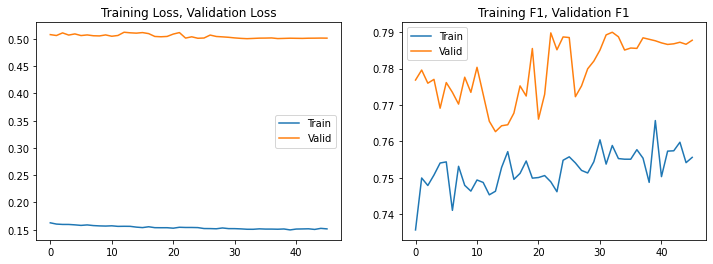

In [52]:
plot_fit()

| Change | Train Loss | Valid Loss | Valid Precis | Valid Recall | Train F1 | Valid F1 |
| ------ | ---------- | ---------- | -------------| --------------| -------- | -------- |
| Before Re-Training  | .135 | .461 | 77.5 | 77.6 | 74.4 | 77.6 |
| After Re-Training   | .151 | .502 | 74.5 | 83.6 | 75.6 | 78.8 |

Although the training loss has gone up (probably due to the introduction of the "previously unseen" new training data), the fine-tuned model is performing ***better***, with a higher overall F1 validation score. Recall and Precision have diverged, but that can be adjusted by tuning the sigmoid thresholds.